In [31]:
from PIL import Image, ImageOps
from fastcore.xtras import Path
import numpy as np
import torch
from clip_interrogator import Config, Interrogator

#from diffusers import FluxControlPipeline
#from transformers import AutoImageProcessor, AutoModelForDepthEstimation

In [2]:
path=Path('/Users/sbrewer/Documents/Datasets/FFHQ')

In [32]:
# predict depth image
depth_image_processor = AutoImageProcessor.from_pretrained("LiheYoung/depth-anything-small-hf")
depth_model = AutoModelForDepthEstimation.from_pretrained("LiheYoung/depth-anything-small-hf")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [8]:
img_lst=[Image.open(o) for o in path.ls() if o.suffix=='.png']

In [9]:
np.array([o.size for o  in img_lst])

array([[512, 512],
       [512, 512],
       [512, 512],
       [512, 512],
       [512, 512],
       [512, 512],
       [512, 512],
       [512, 512],
       [512, 512],
       [512, 512],
       [512, 512],
       [512, 512]])

In [10]:
def image_grid(imgs, rows, cols):
    #assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [37]:
def get_control_img(image):
    # prepare image for the model
    inputs = depth_image_processor(images=image, return_tensors="pt")
    
    with torch.no_grad():
        outputs = depth_model(**inputs)
    
    # interpolate to original size
    post_processed_output = depth_image_processor.post_process_depth_estimation(
        outputs,
        target_sizes=[(image.height, image.width)],
    )
    
    # visualize the prediction
    predicted_depth = post_processed_output[0]["predicted_depth"]
    depth = predicted_depth * 255 / predicted_depth.max()
    depth = depth.detach().cpu().numpy()
    control_image = Image.fromarray(depth.astype("uint8")).convert('RGB')

    return control_image

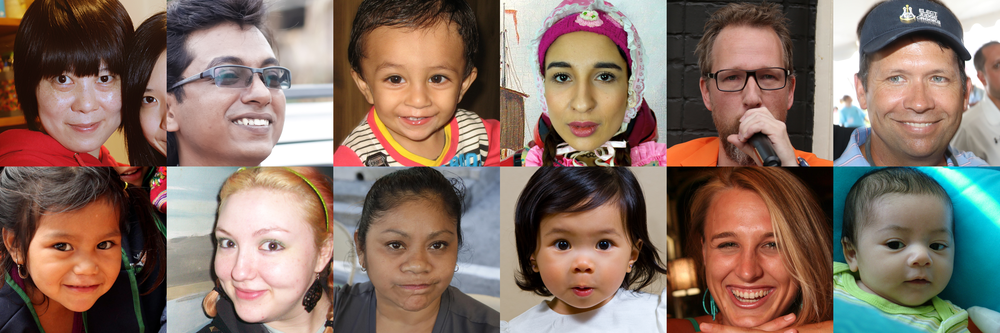

In [38]:
image_grid(img_lst,2, 6)

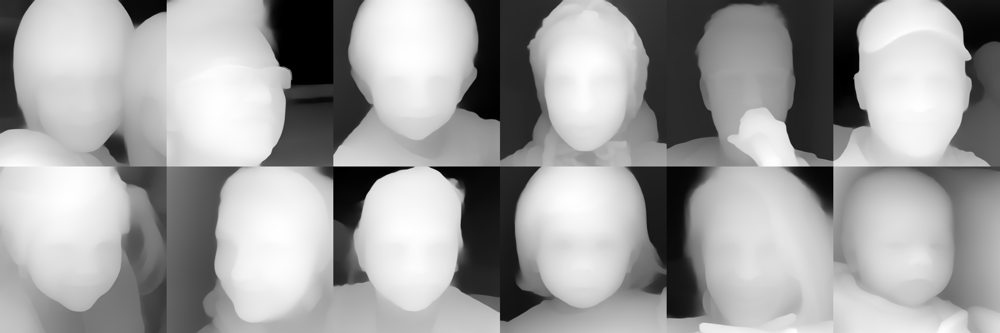

In [39]:
img_depth_lst=[get_control_img(o) for o in img_lst]
image_grid(img_depth_lst,2, 6)

In [14]:
device = 'mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu'
device

'mps'

In [12]:
ci = Interrogator(Config(clip_model_name="ViT-L-14/openai"))

Loading caption model blip-large...


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Loading CLIP model ViT-L-14/openai...


/Users/sbrewer/anaconda3/envs/dlib-kpt/lib/python3.10/site-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


Loaded CLIP model and data in 4.16 seconds.


In [25]:
# --- 1) Robust monkey-patch for LabelTable._rank on the actual instances inside `ci` ---

def _rank_dtype_safe(self, image_features, text_embeds, top_count=1, reverse=False):
    if isinstance(text_embeds, (list, tuple)):
        if len(text_embeds) == 0:
            return []  # no embeddings to rank
        text_embeds = torch.stack([
            torch.from_numpy(t) if not torch.is_tensor(t) else t
            for t in text_embeds
        ])
    elif text_embeds.numel() == 0:
        return []

    text_embeds = text_embeds.to(device=self.device, dtype=image_features.dtype)

    # Autocast only on GPU
    use_amp = (self.device != "cpu") and torch.backends.mps.is_available()
    with torch.cuda.amp.autocast(enabled=use_amp):
        sim = image_features @ text_embeds.T
        if reverse:
            sim = -sim

    k = min(top_count, sim.shape[-1])
    if k == 0:
        return []
    return torch.topk(sim, k).indices.flatten().tolist()

# Apply to each LabelTable instance on this Interrogator
for tbl in [ci.artists, ci.flavors, ci.mediums, ci.movements, ci.trendings]:
    tbl.__class__._rank = _rank_dtype_safe

# --- 2) Optional: make image features follow the CLIP model’s dtype (prevents float/half mismatches) ---

def _image_to_features_follow_model_dtype(self, image):
    # Keep PIL input; do NOT pass tensors here
    if not isinstance(image, Image.Image):
        raise TypeError("Interrogator.image_to_features expects a PIL.Image")

    self._prepare_clip()
    images = self.clip_preprocess(image).unsqueeze(0).to(self.device)
    use_amp = (self.device != "cpu") and torch.backends.mps.is_available()

    with torch.no_grad(), torch.cuda.amp.autocast(enabled=use_amp):
        feats = self.clip_model.encode_image(images)

    # Normalize and cast to model dtype (half on many GPUs, float on CPU)
    feats = feats / feats.norm(dim=-1, keepdim=True)
    model_dtype = next(self.clip_model.parameters()).dtype
    return feats.to(model_dtype)

# Bind the instance method
ci.image_to_features = _image_to_features_follow_model_dtype.__get__(ci, ci.__class__)


In [27]:
prompts=[ci.interrogate(o) for o in img_lst]

/var/folders/jp/2lwscxf50n52zn27l26vj6r00000gq/T/ipykernel_63721/2754789810.py:43: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast(enabled=use_amp):
  0%|                                                    | 0/55 [00:00<?, ?it/s]/var/folders/jp/2lwscxf50n52zn27l26vj6r00000gq/T/ipykernel_63721/2754789810.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 261.96it/s]


In [ ]:
#torch.cuda.amp.autocast(args...)

In [30]:
prompts

['there are two women that are smiling for the camera, wearing a scarlet hoodie, ultrahigh detail, medium shot of two characters, eyes open, asian face, in a laboratory, loosely cropped, good friends, extreme closeup shot, subject in middle, friend',
 'smiling man wearing sunglasses and a tie talking on a cell phone, bangladesh, unique hairstyle, anamorphic bokeh, 2 0 1 9, hairstyle, upclose, loosely cropped, smiling faces, nilah, close detailed face, 2 0 1 0 s, dofresh, a confident smile, detailed expressive faces, hethe srodawa',
 'there is a young boy smiling and holding a toothbrush, head and upper body in frame, aliased, holding nikon camera, face shown, toddler, cover image, loosely cropped, hindu, short dark haircut, photo of head, creative commons attribution, shakti, kind features, rounded face',
 'there is a woman wearing a pink hat and a pink jacket, realistic renaissance portrait, youtube thumbnail, wearing a head scarf, sail boat on the background, realistic restored face,

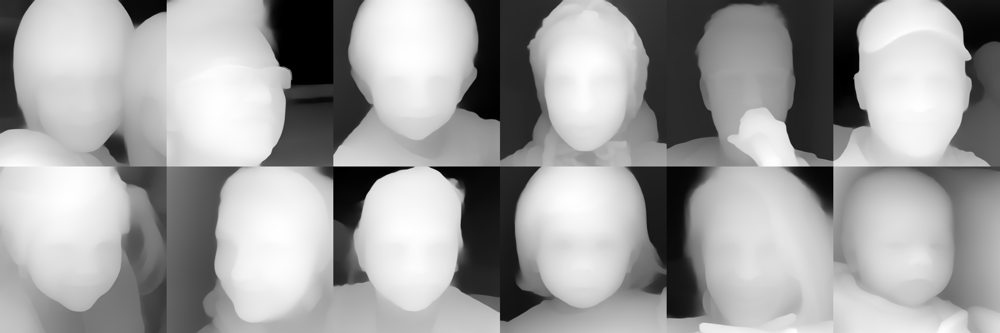

In [40]:
image_grid(img_depth_lst,2, 6)

In [59]:
(path/'depth').mkdir(parents=True, exist_ok=True)
(path/'prompt').mkdir(parents=True, exist_ok=True)
i=0
for o in path.ls(): 
    if o.suffix=='.png':
        print(i,o.stem)
        #save depth
        img_depth_lst[i].save(path/'depth'/f"{o.stem}_d.png") 
        #save prompt
        with open(path/'prompt'/f"{o.stem}.txt", "w") as f:
            f.write(prompts[i])

        i+=1

0 00008
1 00009
2 00010
3 00004
4 00005
5 00011
6 00007
7 00006
8 00002
9 00003
10 00001
11 00000


In [ ]:

img_ai_lst=[]
for prmpt, cntl_img in zip(prompts, img_depth_lst):
    output_image = pipe(
        prompt=prmpt,
        control_image=cntl_img,
        height=512,
        width=512,
        num_inference_steps=30,
        guidance_scale=10.0,
        generator=torch.Generator().manual_seed(0),
        ).images[0]

    img_ai_lst.append(output_image)